In [1]:
import pandas as pd
import pyarrow
import xlwt
data = pd.read_parquet("F:\\HKUST\\Independent Project\\data\\anatxt.parquet.gzip")

In [2]:
data.iloc[:5,:]

,ID,SecuCode,TITLE,content,TYPE_ID,ORGAN_ID,AUTHOR,create_date,entrytime,FYEAR,FQTR
0,166048,600150,中国船舶：三季度业绩符合预期,09 年三季度业绩符合预期：\r\n\r\n 2009 年前三季度中国船舶实...,22,3,王黎明,2009-10-28,2009-12-16 18:17:32,2009.0,4.0
1,166048,600150,中国船舶：三季度业绩符合预期,09 年三季度业绩符合预期：\r\n\r\n 2009 年前三季度中国船舶实...,22,3,王黎明,2009-10-28,2009-12-16 18:17:32,2010.0,4.0
2,166048,600150,中国船舶：三季度业绩符合预期,09 年三季度业绩符合预期：\r\n\r\n 2009 年前三季度中国船舶实...,22,3,王黎明,2009-10-28,2009-12-16 18:17:32,2011.0,4.0
3,166049,600426,华鲁恒升：成本优势体现，三季度业绩符合预期,三季度业绩符合预期：\r\n\r\n 华鲁恒升2009 年前三季度实现销售收...,22,3,时雪松,2009-10-28,2009-12-16 18:17:32,2009.0,4.0
4,166049,600426,华鲁恒升：成本优势体现，三季度业绩符合预期,三季度业绩符合预期：\r\n\r\n 华鲁恒升2009 年前三季度实现销售收...,22,3,时雪松,2009-10-28,2009-12-16 18:17:32,2010.0,4.0


In [3]:
len(data)

1693001

In [4]:
#提取所需要的列
data=data[['SecuCode','content','create_date']]
data.iloc[:5,:]

,SecuCode,content,create_date
0,600150,09 年三季度业绩符合预期：\r\n\r\n 2009 年前三季度中国船舶实...,2009-10-28
1,600150,09 年三季度业绩符合预期：\r\n\r\n 2009 年前三季度中国船舶实...,2009-10-28
2,600150,09 年三季度业绩符合预期：\r\n\r\n 2009 年前三季度中国船舶实...,2009-10-28
3,600426,三季度业绩符合预期：\r\n\r\n 华鲁恒升2009 年前三季度实现销售收...,2009-10-28
4,600426,三季度业绩符合预期：\r\n\r\n 华鲁恒升2009 年前三季度实现销售收...,2009-10-28


In [5]:
data1=pd.read_parquet("F:\\HKUST\\Independent Project\\data\\dsf.parquet.gzip")

In [6]:
len(data1)

11455412

In [7]:
data1.iloc[:5,:]

,SecuCode,date,prc,ret,rvol250d,float,indcode,indname,specret,svol,AFloats,TotalShares
0,000001,2000-03-31,18.37,NaN,NaN,1.968592e+10,SW480000,Banking,NaN,7178744.0,1.071634e+09,1.551847e+09
1,000661,2000-03-31,12.23,NaN,NaN,9.759951e+08,SW370000,Medicals and Biologicals,NaN,2290057.0,7.980336e+07,2.013266e+08
2,600103,2000-03-31,9.26,NaN,NaN,9.630400e+08,SW360000,Light Manufacturing,NaN,6811863.0,1.040000e+08,3.531500e+08
3,000522,2000-03-31,6.79,NaN,NaN,1.020415e+09,SW370000,Medicals and Biologicals,NaN,18608906.0,1.502820e+08,3.743444e+08
4,600640,2000-03-31,27.30,NaN,NaN,1.164663e+09,SW730000,Communications,NaN,857626.0,4.266166e+07,3.648827e+08


In [8]:
#去除specret为空值的行
label_data = data1.dropna(axis=0, how='any')

In [9]:
label_data.iloc[:5,:]

,SecuCode,date,prc,ret,rvol250d,float,indcode,indname,specret,svol,AFloats,TotalShares
253867,000876,2001-04-16,17.70,-0.009513,0.017493,1.132800e+09,SW110000,Agricuture Livestock and Fishing,-0.015848,681049.0,64000000.0,194026000.0
253868,000425,2001-04-16,20.90,0.005775,0.022630,2.536768e+09,SW640000,Machinery,-0.001941,605194.0,121376476.0,352740992.0
253869,600800,2001-04-16,22.99,-0.000435,0.013584,4.011588e+09,SW270000,Electronics,-0.014478,2297049.0,174492752.0,367772802.0
253870,000831,2001-04-16,14.21,0.001409,0.018908,1.385475e+09,SW240000,Non-ferrous Metal,-0.009161,1876583.0,97500000.0,242000000.0
253871,600694,2001-04-16,10.83,0.012150,0.021599,1.301027e+09,SW450000,Commercial,0.001786,1100684.0,120131791.0,226159791.0


In [10]:
#提取所需要的列
label_data=label_data[['SecuCode','date','specret']]

In [11]:
label_data.iloc[:5,:]

,SecuCode,date,specret
253867,000876,2001-04-16,-0.015848
253868,000425,2001-04-16,-0.001941
253869,600800,2001-04-16,-0.014478
253870,000831,2001-04-16,-0.009161
253871,600694,2001-04-16,0.001786


In [12]:
data.rename(columns={'create_date':'date'},inplace=True)
data.iloc[:5,:]

,SecuCode,content,date
0,600150,09 年三季度业绩符合预期：\r\n\r\n 2009 年前三季度中国船舶实...,2009-10-28
1,600150,09 年三季度业绩符合预期：\r\n\r\n 2009 年前三季度中国船舶实...,2009-10-28
2,600150,09 年三季度业绩符合预期：\r\n\r\n 2009 年前三季度中国船舶实...,2009-10-28
3,600426,三季度业绩符合预期：\r\n\r\n 华鲁恒升2009 年前三季度实现销售收...,2009-10-28
4,600426,三季度业绩符合预期：\r\n\r\n 华鲁恒升2009 年前三季度实现销售收...,2009-10-28


In [53]:
data_final = pd.merge(data, label_data, on=['SecuCode','date'])
data_final.iloc[:5,:]

,SecuCode,content,date,specret
0,600150,09 年三季度业绩符合预期：\r\n\r\n 2009 年前三季度中国船舶实...,2009-10-28,0.002331
1,600150,09 年三季度业绩符合预期：\r\n\r\n 2009 年前三季度中国船舶实...,2009-10-28,0.002331
2,600150,09 年三季度业绩符合预期：\r\n\r\n 2009 年前三季度中国船舶实...,2009-10-28,0.002331
3,600426,三季度业绩符合预期：\r\n\r\n 华鲁恒升2009 年前三季度实现销售收...,2009-10-28,0.013218
4,600426,三季度业绩符合预期：\r\n\r\n 华鲁恒升2009 年前三季度实现销售收...,2009-10-28,0.013218


In [54]:
#去重
data_final=data_final.drop_duplicates()

In [55]:
len(data_final)

472420

In [56]:
#重新按时间排序
data_final = data_final.sort_values("date",ascending=True)
#重排索引
data_final = data_final.reset_index(drop=True)
data_final.iloc[:30,:]

,SecuCode,content,date,specret
0,000858,五粮液将通过收购集团盈利能力最强的普什集团约50%股权来减少关联交易，消除“治理...,2006-04-21,0.038601
1,600005,要点：\r\n\r\n 今日武钢股份公布2005年年报和2006年第一季报...,2006-04-25,-0.067634
2,600396,假设年内增发0.8 亿股，我们预测公司2006 年每股摊薄收益约为0.2 元；假设20...,2006-07-06,0.004852
3,600585,中报显示，公司06年上半年销售水泥和熟料3472万吨，接近全年7000万吨预计目标的...,2006-08-24,-0.011362
4,000619,公司是国内最大的塑料型材生产商，目前产能约48万吨左右，主要分布于安徽芜湖本部、...,2006-08-25,0.014963
5,000927,投资要点\r\n\r\n 上半年合资公司一汽丰田销售同比保持高增长，实现净...,2006-08-25,0.026077
6,600016,民生银行2006年上半年经营以稳步扩张，加快内部经营调整步伐为主基调，资产综合盈利能...,2006-08-29,-0.006220
7,600030,事件要点\r\n\r\n 中信证券发布公告，拟增发不超过3.5亿A股，并且公布将进一步...,2007-06-01,0.064292
8,001872,公司5月完成货物吞吐量452.7万吨，同比减少2.1%；赤湾港区、妈湾港区完成集装箱吞...,2007-06-07,-0.012212
9,001872,基本结论、价值评估与投资建议\r\n\r\n 为保证对整个深圳西部港区的控制实现规模化...,2007-06-07,-0.012212


In [57]:
train_start = data_final[data_final.date == "2010-01-04"].index.tolist()[0]
train_start

1207

In [58]:
#去除2010年以前的数据
data_final = data_final.iloc[train_start:,:]
len(data_final)

471213

In [59]:
#重排索引
data_final = data_final.reset_index(drop=True)
data_final.iloc[:30,:]

,SecuCode,content,date,specret
0,600068,事件：\r\n\r\n 葛洲坝2009年新签工程订单同比增长37.9%。公告...,2010-01-04,-0.013306
1,002008,投资提示\r\n\r\n 经过两年调整，公司有望跨入新一轮增长期。1）PCB设备等...,2010-01-04,-0.000854
2,600707,我们认为，公司基于定向增发顺利进行的角度考虑，对CRT 业务的固定资产采取大笔计...,2010-01-04,0.031626
3,600104,自主品牌发展势头良好，2010 年有望扭亏为盈；合资企业上海通用、上海大众盈利能...,2010-01-04,0.032972
4,600423,停牌前重大资产收购预期较弱，股价对重组预期反映不明显。根据我们了解，停牌前机构投资者...,2010-01-04,0.018194
5,002264,公司公告其全资子公司泉州新华都购物广场有限公司拟以人民币5750 万元收购泉州奇龙物...,2010-01-04,0.002592
6,601918,公司四个在产煤矿产能1055 万吨/年，未来三年将有板集矿、口孜东矿和刘庄二期三个...,2010-01-04,0.002262
7,601699,支撑评级的要点\r\n\r\n 公司煤炭产量的42%为冶金用喷吹煤；随着近期...,2010-01-04,0.009319
8,601699,通过兼并重组可新增煤炭资源储量2 亿吨以上，重建投产后有望新增产能400 万吨以上...,2010-01-04,0.009319
9,601001,集团参与资源整合，长期看同煤集团的资产注入将为公司未来发展提供主要的增长动力；公司...,2010-01-04,0.003922


In [60]:
data_final.to_csv('text_data.csv')

In [21]:
#按照股票代码和日期排序
data_final = data_final.sort_values(by=["SecuCode","date"],ascending=True)
#重排索引
data_final = data_final.reset_index(drop=True)
data_final.iloc[:30,:]

,SecuCode,content,date,specret
0,000001,报告起因：\r\n\r\n 今日我们参加了深发展举行的信用卡专题研讨会，信...,2010-01-06,0.001725
1,000001,时间：2010 年1 月6 日； 地点：.深发展总部\r\n\r\n 出席...,2010-01-11,0.004078
2,000001,事件：\r\n\r\n 2010 年1 月6 日下午，深发展举行信用卡专题...,2010-01-11,0.004078
3,000001,事件：\r\n\r\n 09年业绩略超预期。深发展26日公布09年业绩快报，...,2010-01-25,-0.016016
4,000001,最新消息\r\n\r\n 深发展公布了2009 年业绩预告，该行2009 ...,2010-01-26,-0.005369
5,000001,深发展预告2009 年实现净利润约50 亿元，同比增速超过700%。这一利润规模...,2010-01-26,-0.005369
6,000001,本报告导读：\r\n\r\n NIM单季度环比小幅下降，高成本负债占比上升...,2010-01-26,-0.005369
7,000001,事件：\r\n\r\n 09 年业绩略超预期。深发展26 日公布09 年业...,2010-01-27,0.023352
8,000001,事项：\r\n\r\n 深发展业绩预告：09年净利润约50亿，同比增长70...,2010-01-27,0.023352
9,000001,净利润同比增长7倍。2009年公司实现净利润约50亿元，同比增长约714%，实现...,2010-01-27,0.023352


In [22]:
#总数据量
len(data_final)

471213

In [23]:
#股票列表
stocklist = list(set(data_final.iloc[:,0]))
len(stocklist)

3520

In [24]:
def addt_tplus1(data_trial):
    data_trial['t_tplus1'] = data_trial["specret"]
    date_change = []
    for i in range(data_trial.shape[0]-1):
        #记录日期发生改变的索引
        if data_trial.iloc[i,0] == data_trial.iloc[i+1,0] and data_trial.iloc[i,2] != data_trial.iloc[i+1,2]:
            date_change.append(i)
    for i in range(len(date_change)):
        if i == 0:
            data_trial.iloc[0:date_change[i]+1,4] = data_trial.iloc[0:date_change[i]+1,3] + data_trial.iloc[date_change[i]+2,3]
        if date_change[i] == 0:
            data_trial.iloc[0, 4] = data_trial.iloc[0,3] + data_trial.iloc[1,3]
        else:
            data_trial.iloc[date_change[i-1]+1:date_change[i]+1,4] = data_trial.iloc[date_change[i-1]+1:date_change[i]+1,3] + data_trial.iloc[date_change[i]+1,3]
    return data_trial

In [25]:
def addtplus2_tplus6(data_trial):
    data_trial['t+2_t+6'] = data_trial.iloc[:,3]
    #date_change (t+6)
    date_change_6 = []
    for i in range(data_trial.shape[0]-1):
    #if i != data_trial.shape[0]-1:
    #记录日期发生改变的索引
        if data_trial.iloc[i,0] == data_trial.iloc[i+1,0] and data_trial.iloc[i,2] != data_trial.iloc[i+1,2]:
            date_change_6.append(i)
        #data_trial.iloc[i,4] = data_trial.iloc[i,3] + data_trial.iloc[i+1,3]
        if data_trial.iloc[i,0] != data_trial.iloc[i+1,0] :
            del date_change_6[-6:]
    del date_change_6[-6:]
    #t+2_t+6
    for i in range(len(date_change_6)):
        if i == 0:
            data_trial.iloc[0:date_change_6[i]+1,5] = data_trial.iloc[date_change_6[i+2],3] + data_trial.iloc[date_change_6[i+3],3]+ data_trial.iloc[date_change_6[i+4],3]+ data_trial.iloc[date_change_6[i+5],3]+ data_trial.iloc[date_change_6[i+6],3]
        if date_change_6[i] == 0:
            data_trial.iloc[0, 5] = data_trial.iloc[date_change_6[2],3] + data_trial.iloc[date_change_6[3],3]+ data_trial.iloc[date_change_6[4],3]+ data_trial.iloc[date_change_6[5],3]+ data_trial.iloc[date_change_6[6],3]
        else:
            #data_trial.iloc[date_change[i], 4] = data_trial.iloc[date_change[i], 3] + data_trial.iloc[date_change[i]+1, 3]
            data_trial.iloc[date_change_6[i-1]+1:date_change_6[i]+1,5] = data_trial.iloc[date_change_6[i+2],3] + data_trial.iloc[date_change_6[i+3],3]+ data_trial.iloc[date_change_6[i+4],3]+ data_trial.iloc[date_change_6[i+5],3]+ data_trial.iloc[date_change_6[i+6],3]
    return data_trial

In [26]:
import re
import jieba

In [27]:
#使用正则表达式筛选中文字符
def find_chinese (file):
    pattern = re.compile(r'[^\u4e00-\u9fa5]')
    chinese_txt = re.sub(pattern,'',file)
    return chinese_txt

In [28]:
#中文分词+保留形容词、动词
import jieba.posseg as pseg
def cut_word(text):
    #精确模式
    words = pseg.cut(text)
    #jieba_text = ' '.join(jieba_list)
    jieba_list = [x.word for x in words if x.flag == 'v' or x.flag =='a']
    #jieba_list = []
    #single = ['w', 'r', 'ns', 'f', 'p', 'c', 'q', 'n', 'nr', 'm', 'u']
    #double = ['nw', 'u', 'm', 't', 'TIME', 'nr', 'PER', 'nz', 'n', 'q', 'ORG', 'f', 'LOC', 'r', 's']
    #trible = ['s', 'r', 'LOC', 'f', 'ORG', 'nt', 'n', 'nz', 'PER', 'nr', 'TIME', 't', 'm', 'nw']
    #quart = ['s', 'LOC', 'f', 'ORG', 'n', 'nz', 'PER', 'nr', 'TIME', 't', 'm', 'nw']
    #for x in words:
        #if len(x.word) == 1 and x.flag not in single:
            #jieba_list.append(x.word)
        #if len(x.word) == 2 and x.flag not in double:
            #jieba_list.append(x.word)
        #if len(x.word) == 3 and x.flag not in trible:
            #jieba_list.append(x.word)
        #if len(x.word) >= 4 and x.flag not in quart:
            #jieba_list.append(x.word)            
    return jieba_list

In [29]:
#去除停用词
def remove_stopwords(text):
    #读取停用词表
    stopwords = [line.strip() for line in open('F:\\HKUST\\Independent Project\\data\\hit_stopwords.txt','r',encoding='utf-8').readlines()]
    seg_txt = [w for w in text if w not in stopwords] # and len(w) > 1]
    return seg_txt

In [30]:
#词频统计
from collections import Counter
def counter(text):
    seg_list = text
    c = Counter()
    for w in seg_list:
        if w != ' ':
            c[w]+=1
    return c

In [31]:
#文本预处理
def text_preprocess(data):
    artical_word = []
    artical_word_fre = []
    allword = []
    for i in range(data.shape[0]):
        #筛选汉字
        chinese_news = find_chinese(data.iloc[i, 1])
        #中文分词
        chinese_cut = cut_word(chinese_news)
        #去除停用词
        chinese_sentence = remove_stopwords(chinese_cut)
        #词频统计
        lists = counter(chinese_sentence)
        artical_word.append(chinese_sentence)
        artical_word_fre.append(lists)   
    return artical_word, artical_word_fre

In [32]:
#计算数据内所有词频
def word_fre(artical_word):
    allword = []
    for i in artical_word:
        allword += i
    allword_fre = counter(allword)
    return allword_fre

In [34]:
train_end = data_final[data_final.date == "2015-01-05"].index.tolist()[0]
train_end

8261

In [45]:
#choose 2000 data as trial
trian_num = 10000
data_trial = data_final.iloc[:trian_num, :]

In [46]:
data_trial = addt_tplus1(data_trial)

<ipython-input-24-d4c9faa5876c>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trial['t_tplus1'] = data_trial["specret"]


In [58]:
#type(data_trial.iloc[0,4])
data_trial = data_trial[(data_trial.t_tplus1 > 0.02) | ((data_trial.t_tplus1) < -0.02)]

In [47]:
#data_trial.iloc[:10,:]
len(data_trial)

10000

In [43]:
data_trial = addtplus2_tplus6(data_trial)

<ipython-input-25-d768745ff110>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trial['t+2_t+6'] = data_trial.iloc[:,3]


IndexError: list index out of range

In [48]:
len(set(data_trial.iloc[:,0]))

55

In [62]:
#SESTM
#data_positiveRet = data_trial[data_trial['specret'] > 0]
#data_negativeRet = data_trial[data_trial['specret'] <= 0]
data_positiveRet = data_trial[data_trial['t_tplus1'] > 0]
data_negativeRet = data_trial[data_trial['t_tplus1'] <= 0]
#data_positiveRet = data_trial[data_trial['t+2_t+6'] > 0]
#data_negativeRet = data_trial[data_trial['t+2_t+6'] <= 0]
#data_trial = data_trial.astype('object')
PosArtical_word, PosArtical_word_fre = text_preprocess(data_positiveRet)
#NegArtical_word, NegArtical_word_fre = text_preprocess(data_negativeRet)
allArtical_word, allArtical_word_fre = text_preprocess(data_trial)

Building prefix dict from the default dictionary ...
Dumping model to file cache C:\Users\yjq\AppData\Local\Temp\jieba.cache
Loading model cost 1.119 seconds.
Prefix dict has been built successfully.


In [ ]:
#Word2vec

In [63]:
PosArtical_word_fre

[Counter({'联合': 1,
          '负责': 1,
          '进行': 2,
          '分为': 1,
          '贴现': 1,
          '支付': 1,
          '结算': 1,
          '迈向': 1,
          '表': 1,
          '授信': 6,
          '占': 2,
          '分行': 3,
          '做': 5,
          '处于': 1,
          '入主': 1,
          '提出': 3,
          '组织': 1,
          '整合': 1,
          '实现': 1,
          '在岸': 1,
          '提供': 1,
          '强': 1,
          '控制': 4,
          '要求': 1,
          '高': 2,
          '关注': 2,
          '大': 4,
          '放在': 1,
          '操作': 5,
          '提高': 1,
          '集中': 3,
          '改变': 1,
          '建立': 1,
          '称为': 1,
          '强调': 1,
          '有别于': 1,
          '看重': 1,
          '审批': 3,
          '嵌入': 1,
          '相应': 1,
          '设立': 1,
          '良好': 1,
          '保持': 1,
          '不会': 1,
          '冒进': 1,
          '会': 1,
          '增长': 1,
          '不可': 1,
          '恢复': 1,
          '分布': 1,
          '最大': 2,
          '不算': 1,
          '质押': 1,

In [64]:
PosWord_fre = word_fre(PosArtical_word)
#NegWord_fre = word_fre(NegArtical_word)
AllWord_fre = word_fre(allArtical_word)

In [65]:
len(PosArtical_word_fre)
#AllWord_fre

14714

In [66]:
#calculate pai
pai = data_positiveRet.shape[0]/data_trial.shape[0]
pai

0.5994703605622327

In [121]:
posWords_fre = dict(PosWord_fre)
Words_fre = dict(AllWord_fre)

In [122]:
#step1:set screen parameter
num_pos = 500 #100 500
k = 0.1             #0.86 0.88 0.9 0.92 0.94

In [123]:
posWords_fre = sorted(posWords_fre.items(), key=lambda x: x[1], reverse=True)
posWords_fre = posWords_fre[:round(k*len(posWords_fre))]
posWords_fre = dict(posWords_fre)
#posWords_fre = {key: value for key, value in posWords_fre.items() if value > k}


In [124]:
len(posWords_fre)


1139

In [125]:
#计算f_j
posWords_prob = {}
posWords_prob.update(posWords_fre)
for key1, value1 in posWords_fre.items():
    for key2, value2 in Words_fre.items():
        if key1 == key2:
            posWords_prob[key1] = value1/value2
#posWords_prob.items()

In [126]:
#筛选正向词 100 500
posWords_fre = sorted(posWords_prob.items(), key=lambda x: x[1], reverse=True)
posWords = dict(posWords_fre[:num_pos])
negWords = dict(posWords_fre[-num_pos:])
posWords_fre = dict(posWords_fre)

In [127]:
posWords

{'征集': 0.9345794392523364,
 '导航': 0.8562874251497006,
 '要约': 0.8548951048951049,
 '豁免': 0.8392857142857143,
 '出版': 0.7883211678832117,
 '免疫': 0.7833333333333333,
 '露露': 0.7774869109947644,
 '换流': 0.7759562841530054,
 '充电': 0.7685185185185185,
 '提取': 0.7675675675675676,
 '整改': 0.7664670658682635,
 '免税': 0.7653958944281525,
 '出行': 0.7647058823529411,
 '组': 0.7584269662921348,
 '喷': 0.7556053811659192,
 '攀钢': 0.7553956834532374,
 '洗': 0.7548209366391184,
 '博大': 0.75,
 '更名': 0.7396694214876033,
 '挺价': 0.7396694214876033,
 '备考': 0.7393364928909952,
 '加息': 0.7364864864864865,
 '借鉴': 0.736,
 '正版': 0.7348066298342542,
 '充换': 0.732484076433121,
 '再造': 0.7301587301587301,
 '梳理': 0.7297794117647058,
 '审计': 0.728110599078341,
 '购入': 0.7279411764705882,
 '筑': 0.7278911564625851,
 '废': 0.7276995305164319,
 '低估': 0.7250324254215305,
 '签发': 0.7229102167182663,
 '举牌': 0.7210884353741497,
 '不得': 0.7197452229299363,
 '预增': 0.7178947368421053,
 '倒挂': 0.7153284671532847,
 '共享': 0.7142857142857143,
 '拟定': 0

In [128]:
#筛选负向词 100 500
#posWords = {key:value for key, value in posWords_prob.items() if value >= pai+alpha_pos}
#negWords = {key:value for key, value in posWords_prob.items() if value <= pai - alpha_neg}
negWords

{'下乡': 0.606694560669456,
 '好转': 0.6066291432145091,
 '增持': 0.6065557337610264,
 '采取': 0.6062992125984252,
 '增值': 0.6062992125984252,
 '导入': 0.6062639821029083,
 '认为': 0.606241004841031,
 '尚有': 0.6060606060606061,
 '挖掘': 0.6059957173447538,
 '认识': 0.6056910569105691,
 '搭建': 0.6056338028169014,
 '予以': 0.6055555555555555,
 '收到': 0.6055124892334195,
 '假定': 0.6054054054054054,
 '依赖': 0.6053921568627451,
 '输出': 0.6053639846743295,
 '携手': 0.6053639846743295,
 '位列': 0.6051779935275081,
 '跨': 0.605,
 '购买': 0.6049450549450549,
 '起到': 0.6049382716049383,
 '拆迁': 0.6047619047619047,
 '已有': 0.6047156726768377,
 '考虑': 0.6047008547008547,
 '看到': 0.6047008547008547,
 '指引': 0.6046511627906976,
 '回升': 0.60431654676259,
 '竣工': 0.6041666666666666,
 '逐': 0.6039783001808319,
 '加上': 0.6039603960396039,
 '自给': 0.6038961038961039,
 '完成': 0.6038545631225201,
 '小于': 0.6037296037296037,
 '释放': 0.6035843823341156,
 '培养': 0.6035502958579881,
 '升至': 0.6035353535353535,
 '佳': 0.6032863849765259,
 '精密': 0.603076923076

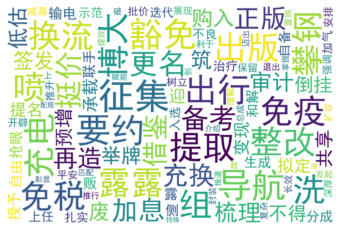

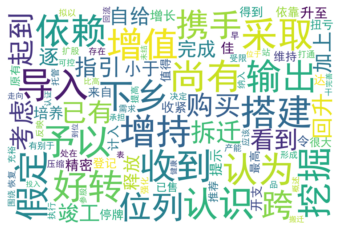

In [129]:
#wordcloud
from wordcloud import WordCloud
import matplotlib.pyplot as plt
# 绘制词云
def plotword(sentiwords):
    my_cloud = WordCloud(
    background_color='white',  # 设置背景颜色  默认是black
    width=900, height=600,
    max_words=100,            # 词云显示的最大词语数量
    font_path='simhei.ttf',   # 设置字体  显示中文
    max_font_size=99,         # 设置字体最大值
    min_font_size=16,         # 设置子图最小值
    random_state=50           # 设置随机生成状态，即多少种配色方案
    ).generate_from_frequencies(sentiwords)

    # 显示生成的词云图片
    plt.imshow(my_cloud, interpolation='bilinear')
    # 显示设置词云图中无坐标轴
    plt.axis('off')
    plt.show()
plotword(posWords)    
plotword(negWords)

In [130]:
#step2
# sentiment_word
sentiWords = {key:value for key, value in posWords_fre.items() if key in posWords or key in negWords}

In [131]:
PosArtical_word_fre[0]

Counter({'联合': 1,
         '负责': 1,
         '进行': 2,
         '分为': 1,
         '贴现': 1,
         '支付': 1,
         '结算': 1,
         '迈向': 1,
         '表': 1,
         '授信': 6,
         '占': 2,
         '分行': 3,
         '做': 5,
         '处于': 1,
         '入主': 1,
         '提出': 3,
         '组织': 1,
         '整合': 1,
         '实现': 1,
         '在岸': 1,
         '提供': 1,
         '强': 1,
         '控制': 4,
         '要求': 1,
         '高': 2,
         '关注': 2,
         '大': 4,
         '放在': 1,
         '操作': 5,
         '提高': 1,
         '集中': 3,
         '改变': 1,
         '建立': 1,
         '称为': 1,
         '强调': 1,
         '有别于': 1,
         '看重': 1,
         '审批': 3,
         '嵌入': 1,
         '相应': 1,
         '设立': 1,
         '良好': 1,
         '保持': 1,
         '不会': 1,
         '冒进': 1,
         '会': 1,
         '增长': 1,
         '不可': 1,
         '恢复': 1,
         '分布': 1,
         '最大': 2,
         '不算': 1,
         '质押': 1,
         '率': 1,
         '发生': 2,
         '暴跌': 1,

In [132]:
import numpy as np
def dsi_si(word_fre,sentiWords):
    temp_si = []
    temp_dsi = []
    for artical in word_fre:
        temp_senti = {key:0 for key, value in sentiWords.items()}
        for key1, value1 in artical.items():
            if key1 in temp_senti:
                temp_senti[key1] = value1
        temp_si.append(sum(temp_senti.values()))
        temp_dsi.append(list(temp_senti.values()))
    #temp_senti
    temp_dsi = np.array(temp_dsi)
    return temp_dsi,temp_si

In [133]:
#calculate si d[s],i hi
import numpy as np
si = []
dsi = []

for artical in allArtical_word_fre:
    temp_senti = {key:0 for key, value in sentiWords.items()}
    for key1, value1 in artical.items():
        if key1 in temp_senti:
            temp_senti[key1] = value1
    si.append(sum(temp_senti.values()))
    dsi.append(list(temp_senti.values()))
#temp_senti
dsi = np.array(dsi)
#hi = [dsi[i]/si[i] for i in range(len(si))]
hi = []
for i in range(len(si)):
    if si[i] == 0:
        hi.append(0)
    else:
        hi.append(dsi[i]/si[i])
hi

[array([0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.01333333, 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.02666667, 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.  

In [134]:
score = (data_trial['specret'].rank())/data_trial.shape[0]
score

3        0.258097
19       0.259646
20       0.259646
21       0.259646
22       0.259646
           ...   
49995    0.331147
49996    0.329864
49997    0.329864
49998    0.880240
49999    0.880240
Name: specret, Length: 24545, dtype: float64

In [135]:
#construct W
W = np.array([list(score),list(1-score)])
W

array([[0.25809737, 0.25964555, 0.25964555, ..., 0.32986352, 0.88024037,
        0.88024037],
       [0.74190263, 0.74035445, 0.74035445, ..., 0.67013648, 0.11975963,
        0.11975963]])

In [136]:
#calculate O
hi = np.array(hi).T
temp_W = np.linalg.inv(np.dot(W,W.T))
topic = np.dot(np.dot(hi, W.T), temp_W)
topic = np.array(topic)

<ipython-input-136-c33a2a9e3785>:2: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  hi = np.array(hi).T


In [137]:
#step 3 
topic = topic.T

In [138]:
#step3
sum(topic[0])
sum(topic[1])

0.9882394637657468

In [139]:
#scoring new artical
test_num = 2000
#train_num = 10000
data_test = data_final.iloc[trian_num : trian_num + test_num, :]
test_word, test_word_fre = text_preprocess(data_test)

In [140]:
dsi_test, si_test = dsi_si(test_word_fre, sentiWords)

In [141]:
si_test

[65,
 83,
 83,
 50,
 75,
 42,
 90,
 44,
 18,
 39,
 70,
 82,
 39,
 66,
 81,
 70,
 94,
 49,
 52,
 90,
 71,
 93,
 84,
 72,
 86,
 59,
 59,
 47,
 51,
 56,
 63,
 70,
 49,
 79,
 61,
 40,
 66,
 67,
 58,
 89,
 59,
 62,
 76,
 76,
 71,
 106,
 92,
 53,
 0,
 64,
 69,
 66,
 99,
 131,
 67,
 62,
 119,
 97,
 51,
 61,
 80,
 98,
 63,
 72,
 53,
 77,
 51,
 80,
 67,
 54,
 85,
 49,
 0,
 115,
 64,
 74,
 84,
 64,
 190,
 43,
 53,
 71,
 42,
 65,
 96,
 73,
 0,
 45,
 58,
 62,
 31,
 125,
 100,
 86,
 72,
 71,
 62,
 65,
 63,
 105,
 97,
 65,
 90,
 54,
 51,
 85,
 115,
 82,
 103,
 81,
 107,
 50,
 119,
 92,
 73,
 109,
 52,
 56,
 69,
 53,
 87,
 117,
 55,
 89,
 94,
 91,
 89,
 92,
 196,
 115,
 52,
 49,
 63,
 100,
 54,
 46,
 149,
 90,
 77,
 68,
 80,
 115,
 100,
 125,
 66,
 41,
 90,
 68,
 80,
 115,
 85,
 50,
 103,
 74,
 84,
 78,
 110,
 63,
 71,
 68,
 93,
 49,
 64,
 65,
 0,
 61,
 100,
 138,
 109,
 0,
 69,
 63,
 111,
 63,
 71,
 82,
 45,
 100,
 53,
 122,
 124,
 66,
 93,
 68,
 104,
 72,
 61,
 67,
 0,
 0,
 66,
 43,
 61,
 116,
 52,

In [142]:
import scipy.optimize as opt
import math
from scipy.optimize import minimize_scalar

lamda = 0.3
result_p = []

for i in range(len(si_test)):
    fun = lambda p: -((np.dot(dsi_test[i], np.log(p*topic[0]+(1-p)*topic[1]))/si_test[i]) + lamda*math.log(p*(1-p)))
    bnds = [(0,1)]
    #res = opt.minimize(fun=fun , x0=0.5, bounds = bnds)
    res = minimize_scalar(fun, bounds=(0, 1), method='bounded')
    result_p.append(res.x)
result_p
data_test = addt_tplus1(data_test)

<ipython-input-142-80586ddd9f98>:9: RuntimeWarning: invalid value encountered in double_scalars
  fun = lambda p: -((np.dot(dsi_test[i], np.log(p*topic[0]+(1-p)*topic[1]))/si_test[i]) + lamda*math.log(p*(1-p)))


[0.5231801006603124,
 0.4905195333882596,
 0.5219870865345576,
 0.5012365347277503,
 0.5335965537750513,
 0.5083698413202828,
 0.5391082457265821,
 0.4536434276234408,
 0.5355629652948073,
 0.4876421906877931,
 0.5209886063934783,
 0.4494012852455814,
 0.4651080645059186,
 0.4586081801873518,
 0.47837957697953415,
 0.478660155769071,
 0.5057398899476181,
 0.48812207784976,
 0.4390189022597808,
 0.48436497764505,
 0.4633768073395553,
 0.4769225578537799,
 0.5016661516085049,
 0.44549259825976023,
 0.4742750308208422,
 0.48806188315029486,
 0.4545438128379127,
 0.46554613041454806,
 0.4831920424172243,
 0.4541713453370693,
 0.46612288859324086,
 0.5059554715290174,
 0.43908056881054497,
 0.492922086916449,
 0.5667467161996879,
 0.4802385385558824,
 0.5463914123617212,
 0.5148154392740009,
 0.5057773569887113,
 0.5285675973334341,
 0.5508630240520354,
 0.5079350226976355,
 0.47388804582061916,
 0.5205468256979852,
 0.47545134164051,
 0.5121766030570147,
 0.5005475359077578,
 0.51813252665

In [143]:
#loss function
true_p = (data_test['specret'].rank())/data_test.shape[0]
def loss(result_p, true_p):
    loss = np.linalg.norm(result_p - true_p, ord = 1)
    return loss
loss(result_p, true_p)

495.3284003456654

In [144]:
#参数寻优
#正向负向各取500 
#train10-14
#test 15-now
#t+(t+1)
#只挑v a
#根据长度筛选


In [145]:
coef = pd.DataFrame({'true_p':true_p,'result_p':result_p})
coef.corr('spearman')

,true_p,result_p
true_p,1.000000,0.120634
result_p,0.120634,1.000000


In [146]:
coef.corr('pearson')

,true_p,result_p
true_p,1.000000,0.112306
result_p,0.112306,1.000000


In [205]:
#通过已有词库计算情感得分
neg_diction1 = pd.read_excel("F:\\HKUST\\Independent Project\\data\\金融领域中文情绪词典.xlsx", sheet_name="年报负面",header=None)
pos_diction1 = pd.read_excel("F:\\HKUST\\Independent Project\\data\\金融领域中文情绪词典.xlsx", sheet_name="年报正面",header=None)
neg_diction2 = pd.read_excel("F:\\HKUST\\Independent Project\\data\\中文金融情感词典_姜富伟等(2020).xlsx", sheet_name="negative")
pos_diction2 = pd.read_excel("F:\\HKUST\\Independent Project\\data\\中文金融情感词典_姜富伟等(2020).xlsx", sheet_name="positive")

In [206]:
neg_diction1.columns=['负面词']
pos_diction1.columns=['正面词']

In [207]:
neg_diction1 = list(neg_diction1.iloc[:,0])
pos_diction1 = list(pos_diction1.iloc[:,0])

In [208]:
for i in range(neg_diction2.shape[0]):
    neg_diction2.iloc[i,0] = neg_diction2.iloc[i,0][:-1]
for i in range(pos_diction2.shape[0]):
    pos_diction2.iloc[i,0] = pos_diction2.iloc[i,0][:-1]
neg_diction2 = list(neg_diction2.iloc[:,0])
pos_diction2 = list(pos_diction2.iloc[:,0])

In [210]:
diction_p1 = []
diction_p2 = []
diction_p3 = []
for artical in test_word_fre:
    pos_num = 0
    neg_num = 0
    word_sum = sum(artical.values())
    if word_sum == 0 :
        diction_p1.append(0)
        diction_p2.append(0)
        diction_p3.append(0)
        continue
    for key, value in artical.items():
        if key in pos_diction2:
            pos_num += value
        if key in neg_diction2:
            neg_num += value
    diction_p1.append(pos_num/word_sum)
    diction_p2.append(-1*(neg_num/word_sum))
    diction_p3.append(pos_num/word_sum-(neg_num/word_sum))

In [209]:
pos_diction2

['安定',
 '安康',
 '帮助',
 '榜样',
 '饱满',
 '保证',
 '筚路蓝缕',
 '变得更好',
 '举手称赞',
 '标杆',
 '不可思议的',
 '破格录用',
 '才思',
 '喜兆',
 '彩头',
 '灿烂的',
 '昌盛',
 '超常发挥',
 '超群的',
 '超越',
 '称赞',
 '称赞的',
 '成功',
 '成功的',
 '成功者',
 '成果',
 '成就',
 '诚恳',
 '充裕',
 '充裕的',
 '充足',
 '宠爱',
 '宠爱的',
 '出众的',
 '创新',
 '创业',
 '创造',
 '创造力',
 '创造性',
 '创造性的',
 '创造性地',
 '慈善事业的',
 '从容不迫',
 '从容地',
 '促进',
 '达到目的',
 '打动人',
 '打动人心的',
 '大获成功',
 '大量',
 '大人物',
 '大师',
 '大受欢迎',
 '到达',
 '得天独厚的',
 '得益',
 '第一的',
 '巅峰时刻',
 '典范',
 '斗志昂扬',
 '独创性',
 '独家',
 '独家报道',
 '独家经营',
 '独特魅力',
 '独有的',
 '多才多艺的',
 '多功能性',
 '恩惠',
 '发明',
 '发明家',
 '发明者',
 '发展',
 '发展潜力',
 '繁荣',
 '方便地',
 '非常卓越的',
 '奋勇争先',
 '丰富',
 '丰富的',
 '丰饶的',
 '风度翩翩',
 '符合要求的',
 '富庶的',
 '改进',
 '改良',
 '改善',
 '感到满意',
 '高手',
 '高效',
 '高新',
 '高兴',
 '高兴的',
 '高瞻远瞩',
 '革新',
 '给人深刻印象',
 '公平',
 '公正',
 '功成名就',
 '恭喜',
 '巩固',
 '鼓励',
 '鼓励的',
 '鼓舞',
 '鼓舞人心的',
 '关键时刻',
 '光荣的',
 '国泰民安',
 '好处',
 '好的',
 '合算的',
 '合意',
 '合作',
 '和睦的',
 '恒心',
 '欢呼',
 '欢呼雀跃',
 '缓和',
 '回升',
 '活力四射',
 '活跃',
 '活跃的',
 '获得授权的',
 '获利',
 '获胜',
 '获胜的',
 '机遇

In [215]:
coef_diction = pd.DataFrame({'true_p':true_p,'diction_p':diction_p3})
coef_diction.corr('spearman')

,true_p,diction_p
true_p,1.000000,0.057325
diction_p,0.057325,1.000000


In [216]:
coef_diction.corr('pearson')

,true_p,diction_p
true_p,1.000000,0.060905
diction_p,0.060905,1.000000
